<a href="https://colab.research.google.com/github/asadian98/Deep-Learning-Course-EE25647/blob/Add_Class_Add_dropout_Add_batchNorm/HW1/HW1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In the name of God

HW1, Computer Assignment, Question 1:
**Hand Gestures Classification** (Tensorflow 1.x)

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd 'drive/MyDrive'

%cd DL2122_HW01

%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive
/content/drive/MyDrive/DL2122_HW01
TensorFlow 1.x selected.
1.15.2


In [2]:
import pandas as pd
import io
import math
import matplotlib.pyplot as plt
import numpy as np

dftest = pd.read_csv('Q1_test.csv')
dftrain = pd.read_csv('Q1_train.csv')

y_training = dftrain.pop('label')
y_test = dftest.pop('label')

In [3]:
dftrain.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,...,pixel745,pixel746,pixel747,pixel748,pixel749,pixel750,pixel751,pixel752,pixel753,pixel754,pixel755,pixel756,pixel757,pixel758,pixel759,pixel760,pixel761,pixel762,pixel763,pixel764,pixel765,pixel766,pixel767,pixel768,pixel769,pixel770,pixel771,pixel772,pixel773,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,107,118,127,134,139,143,146,150,153,156,158,160,163,165,159,166,168,170,170,171,171,171,172,171,171,170,170,169,111,121,129,135,141,144,148,151,154,157,160,163,...,205,206,206,207,207,206,206,204,205,204,203,202,142,151,160,172,196,188,188,190,135,96,86,77,77,79,176,205,207,207,207,207,207,207,206,206,206,204,203,202
1,155,157,156,156,156,157,156,158,158,157,158,156,154,154,153,152,151,149,149,148,147,146,144,142,143,138,92,108,158,159,159,159,160,160,160,160,160,160,160,159,...,100,78,120,157,168,107,99,121,133,97,95,120,135,116,95,79,69,86,139,173,200,185,175,198,124,118,94,140,133,84,69,149,128,87,94,163,175,103,135,149
2,187,188,188,187,187,186,187,188,187,186,185,185,185,184,184,184,181,181,179,179,179,178,178,109,52,66,77,83,188,189,189,188,188,189,188,188,188,188,187,185,...,203,204,203,201,200,200,199,198,196,195,194,193,198,166,132,114,89,74,79,77,74,78,132,188,210,209,206,205,204,203,202,201,200,199,198,199,198,195,194,195
3,211,211,212,212,211,210,211,210,210,211,209,207,208,207,206,203,202,201,200,198,197,195,192,197,171,51,52,54,212,213,215,215,212,212,213,212,212,211,211,209,...,247,242,233,231,230,229,227,225,223,221,220,216,58,51,49,50,57,60,17,15,18,17,19,1,159,255,237,239,237,236,235,234,233,231,230,226,225,222,229,163
4,164,167,170,172,176,179,180,184,185,186,188,189,189,190,191,189,190,190,187,190,192,193,191,191,192,192,194,194,166,169,172,174,177,180,182,185,186,187,190,191,...,90,77,88,117,123,127,129,134,145,152,156,179,105,106,105,104,104,104,175,199,178,152,136,130,136,150,118,92,85,76,92,105,105,108,133,163,157,163,164,179


In [4]:
dftrain.describe()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,...,pixel745,pixel746,pixel747,pixel748,pixel749,pixel750,pixel751,pixel752,pixel753,pixel754,pixel755,pixel756,pixel757,pixel758,pixel759,pixel760,pixel761,pixel762,pixel763,pixel764,pixel765,pixel766,pixel767,pixel768,pixel769,pixel770,pixel771,pixel772,pixel773,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,...,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000,27455.000000
mean,145.419377,148.500273,151.247714,153.546531,156.210891,158.411255,160.472154,162.339683,163.954799,165.533673,166.685522,167.811983,168.495647,169.310872,169.956948,170.460463,170.716518,170.872701,170.808887,170.481442,169.979749,169.264506,168.144127,166.936660,165.765944,163.620725,161.933600,161.349117,147.146858,150.284502,152.941978,155.415043,158.068986,160.229576,162.345802,164.291167,165.736332,166.991732,168.503187,169.287307,...,131.949918,134.583755,139.361974,148.115862,155.095465,160.346858,163.915607,165.364414,165.911273,165.182080,164.407977,163.488254,143.407758,144.189474,145.711637,147.660718,149.019414,148.670843,148.185212,147.298926,146.286323,144.027062,142.966017,139.769550,137.071572,135.277181,131.922783,130.232235,132.046367,135.289237,141.104863,147.495611,153.325806,159.125332,161.969259,162.736696,162.906137,161.966454,161.137898,159.824731
std,41.358555,39.942152,39.056286,38.595247,37.111165,36.125579,35.016392,33.661998,32.651607,31.279244,30.558445,29.771007,29.329251,28.620248,27.961255,27.053544,26.763535,26.307419,26.088459,26.475963,26.940885,27.871515,29.368386,30.906718,31.902723,34.303747,35.991306,36.571064,41.555429,40.094304,39.427215,38.686176,37.242459,36.373576,35.242915,33.899171,32.759395,31.656140,30.833853,30.285472,...,57.586028,60.373218,63.301768,63.300608,63.511566,62.551522,61.833119,62.210750,62.163516,61.958245,61.950177,62.403709,54.406116,53.658786,54.710497,54.613724,54.351761,55.233710,55.904715,57.155523,57.965677,57.393379,56.689603,56.118823,54.680900,55.278778,56.384076,58.111783,59.204300,62.553694,63.751194,65.512894,64.427412,63.708507,63.738316,63.444008,63.509210,63.298721,63.610415,64.396846
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,23.000000,28.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

In [5]:
print("train_images", dftrain.shape)
print("test_images", dftest.shape)

train_images (27455, 784)
test_images (7172, 784)


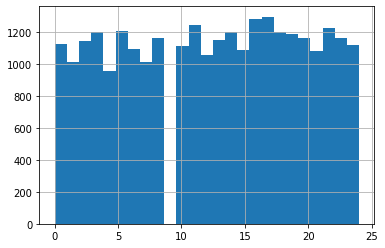

In [6]:
y_training.hist(bins=25)

In [7]:
import string
picDict = dict((i, string.ascii_uppercase[i]) for i in range(25))
flag = True

Text(0.5, 1.0, 'G')

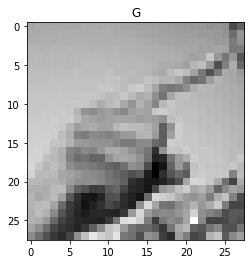

In [8]:
plt.imshow(dftrain.loc[1].values.reshape((28, 28)),cmap='gray')
plt.title(picDict[y_training[1]])

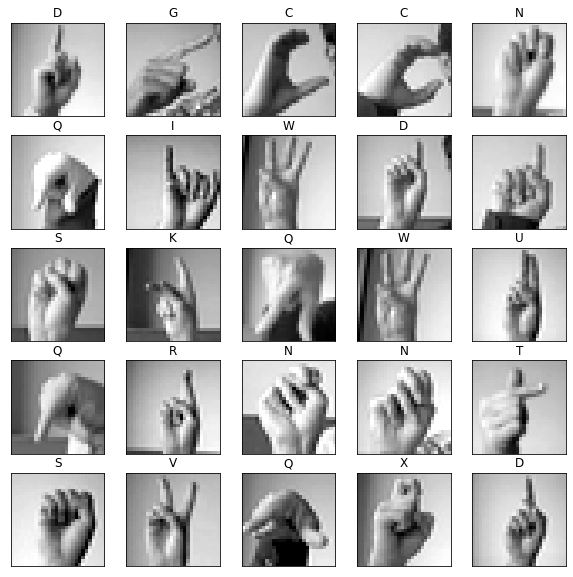

In [9]:
plt.figure(figsize=(10, 10))
for i in range(25):
  plt.subplot(5, 5, i+1)
  plt.imshow(dftrain.loc[i].values.reshape((28, 28)), cmap='gray')
  if i != 9:
    plt.title(picDict[y_training[i]])
  plt.xticks([])
  plt.yticks([])
  
plt.show()

In [10]:
dftrain = dftrain / 255.0
dftest = dftest / 255.0

num_test=dftest.shape[0]
num_valid=int(0.3*dftrain.shape[0])
num_train=dftrain.shape[0]-num_valid

print("number of test data: ", num_test)
print("number of validation data: ", num_valid)
print("number of train data: ", num_train)

x_valid=dftrain.loc[num_train:]
y_valid=y_training[num_train:]

x_train=dftrain.loc[0:num_train-1]
y_train=y_training[0:num_train]

y_train_hot=tf.Session().run(tf.one_hot(y_train,25))
y_valid_hot=tf.Session().run(tf.one_hot(y_valid,25))
y_test_hot=tf.Session().run(tf.one_hot(y_test,25))
tf.Session().close()

number of test data:  7172
number of validation data:  8236
number of train data:  19219


In [11]:
x_train_shaffle=tf.Session().run(tf.random.shuffle(x_train, seed=12321 ))
y_train_shaffle=tf.Session().run(tf.random.shuffle(y_train_hot, seed=12321))
tf.Session().close()
print(x_train_shaffle.shape)

(19219, 784)


In [12]:
tf.reset_default_graph()


In [13]:
class MLP:
  def __init__(self, layers, Optimizer, rl, normal_std, dropout_flag, batch_norm_flag, num_class = 25):

    self.layers = layers
    # -------------------------------- Input Layer ----------------------------#
    self.input = tf.placeholder(dtype=tf.float32, shape=(None,layers[0]), name='INPUT')
    self.O = dict()
    self.O[0] = self.input

    # ------------------------------- Hidden Layers ---------------------------#
    self.weights = dict()
    self.biases = dict()
    for i in range(1, len(layers)):
      
      with tf.variable_scope(f'Layer-{i}-{i+1}'):
        self.weights[i] = tf.get_variable (
                      name = 'W_',dtype = tf.float32,
                      shape = (self.layers[i-1], self.layers[i]),
                      initializer = tf.truncated_normal_initializer(stddev=normal_std)
                  )
        tf.summary.histogram('W_', self.weights[i])
        self.weights[i] = tf.get_variable(dtype=tf.float32, shape=(self.layers[i-1], self.layers[i]),name='W_'+str(i),
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
        tf.summary.histogram ('histogram_of_weights', self.weights[i])
        # print(i, (self.layers[i-1], self.layers[i]))
      
        self.biases[i] = tf.get_variable(dtype=tf.float32, shape=(self.layers[i], ) , name='B_'+str(i),
                  initializer=tf.zeros_initializer())
        tf.summary.histogram ('histogram_of_biases', self.biases[i])
        # print(self.O[i-1].shape)
        H=tf.matmul(self.O[i-1], self.weights[i])
        self.O[i]=tf.add(H,self.biases[i])
        # print(self.O[i].shape)

        self.dropout = tf.placeholder(dtype=tf.float32, shape=(), name='dropout')
        self.batch_norm = tf.placeholder (dtype=tf.bool, shape=(), name = 'batch_normalization')

        if i < len(self.layers)-1:
          self.O[i] = tf.nn.relu(self.O[i])
          if(batch_norm_flag == True):
            self.O[i] = tf.layers.batch_normalization(self.O[i], training = self.batch_norm)
          if(dropout_flag == True):
            self.O[i] = tf.nn.dropout(self.O[i], rate = self.dropout)

    # ------------------------------- Output Layer ----------------------------#
    self.output = tf.placeholder(dtype=tf.float32, shape=(None,layers[-1]), name='Output')

    # ----------------------------------- Loss --------------------------------#
    self.loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=self.output,
                                                                      logits= self.O[len(self.layers)-1],
                                                                      name='LOSS'))
    tf.summary.scalar('loss', self.loss)
    # --------------------------------- Optimizer -----------------------------#
    self.optimizer = Optimizer(rl, use_locking=False, name='GradientDescent').minimize(self.loss)

    # --------------------------------- Accuracy ------------------------------#  
    self.corrects = tf.equal(tf.argmax(self.O[len(self.layers)-1],1),tf.argmax(self.output,1),name='corrects')
    self.accuracy = tf.reduce_mean(tf.cast(self.corrects, tf.float32), name='accuracy')
    tf.summary.scalar('accuracy', self.accuracy)

    # ------------------------------ Delete Log Path --------------------------#  
    if(Optimizer == tf.train.GradientDescentOptimizer):
      self.logs_path = "./logs/visualize_graph_SGD"
    else:
      self.logs_path = "./logs/visualize_graph_Adam"

    if tf.gfile.Exists(self.logs_path):
      tf.gfile.DeleteRecursively(self.logs_path) 

    # -------------------------------- Initialize -----------------------------#  
    self.sess = tf.InteractiveSession()
    self.init = tf.global_variables_initializer()
    self.sess.run(self.init)
    
  def train(self, x_train, y_train, x_valid, y_valid, num_epoch, batchsize):
    merged = tf.summary.merge_all()
    train_writer = tf.summary.FileWriter(self.logs_path, self.sess.graph)

    global_step = 0
    training_los = []
    valid_los = []
    print('---------------------------------------------------------')
    for epoch in range(0,num_epoch):
        for i in range(math.floor(x_train.shape[0]/batchsize)):
            global_step += 1
            f={self.input:x_train[i*batchsize : (i+1)*batchsize],  
               self.output:y_train[i*batchsize : (i+1)*batchsize]}
            _, summary_tr, loss_value = self.sess.run([self.optimizer, merged, self.loss],feed_dict=f)
            training_los.append(loss_value)
            train_writer.add_summary(summary_tr, global_step)
        f_valid={self.input:x_valid , 
                self.output:y_valid}
        loss_valid, acc_valid = self.sess.run([self.loss,self.accuracy],feed_dict=f_valid)
        valid_los.append(loss_valid)
        print("Epoch: {0}, validation loss: {1:.2f}, validation accuracy: {2:.01%}".format(epoch + 1, loss_valid, acc_valid))
    print('---------------------------------------------------------')

    return training_los, valid_los

  def predict(self, x_test):
    pred = self.sess.run(self.O[len(self.layers)-1], feed_dict={self.input: x_test})
    return np.argmax(pred,axis=1)

  def test_network(self, x_test, y_test, y_test_hot):
    loss_test, acc_test = self.sess.run([self.loss, self.accuracy], feed_dict={self.input: x_test, self.output: y_test_hot})
    print('---------------------------------------------------------')
    print("Test loss: {0:.2f}, test accuracy: {1:.01%}".format(loss_test, acc_test))
    print('---------------------------------------------------------')
    prediction = self.predict(x_test)
    conf_mat = confusion_matrix(y_test, prediction)
    conf_norm = np.around(conf_mat.astype('float') / conf_mat.sum(axis=1)[:, np.newaxis], decimals=2)
    conf_df = pd.DataFrame(conf_norm, index = picDict.values(), columns = picDict.values())
    figure = plt.figure(figsize=(20, 20))
    sn.heatmap(conf_df, annot=True)
    plt.show()
    self.sess.close()


### GradientDescentOptimizer

Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.

---------------------------------------------------------
Epoch: 1, validation loss: 2.48, validation accuracy: 26.1%
Epoch: 2, validation loss: 1.30, validation accuracy: 56.5%
Epoch: 3, validation loss: 1.12, validation accuracy: 65.3%
Epoch: 4, validation loss: 0.67, validation accuracy: 77.4%
Epoch: 5, validation loss: 0.66, validation accuracy: 77.9%
Epoch: 6, validation loss: 0.29, validation accuracy: 91.5%
Epoch: 7, validation loss: 0.16, validation accuracy: 96.2%
Epoch: 8, validation loss: 0.35, validation accuracy: 90.9%
Epoch: 9, validation loss: 0.09, validation accuracy: 98.3%
Epoch: 10, validation loss: 0.05, validation accuracy: 99.2%
Epoch: 11, validation loss: 0.03, validation accuracy: 99.8%
Epoch: 12, validation loss: 0.02, validation accuracy: 100.0%
Epoch: 13, validation loss:

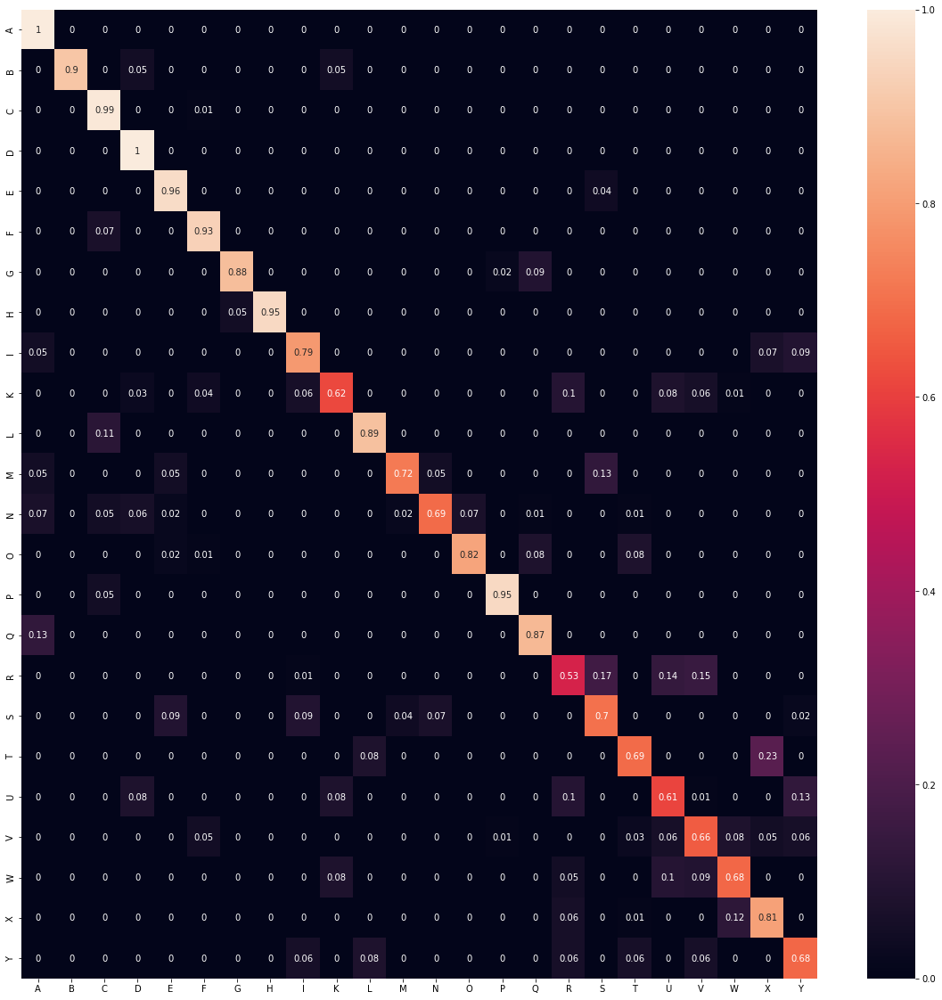

In [14]:
tf.reset_default_graph()

MLP_SGD = MLP(layers=[784, 512, 512, 64, 25], Optimizer=tf.train.GradientDescentOptimizer,
           rl=0.05, normal_std=0.1, dropout_flag = False, batch_norm_flag = False, num_class = 25)

training_los, valid_los = MLP_SGD.train(x_train=x_train_shaffle, y_train=y_train_shaffle,
                                        x_valid=x_valid, y_valid=y_valid_hot, num_epoch=15, batchsize=64)

import seaborn as sn
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

if flag == True:
  del picDict[9]
  flag = False
MLP_SGD.test_network(dftest, y_test, y_test_hot)

In [15]:
%load_ext tensorboard
%tensorboard --logdir logs/visualize_graph_SGD/

In [16]:
%reload_ext tensorboard

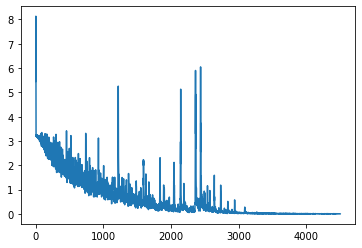

In [17]:
plt.plot(training_los)

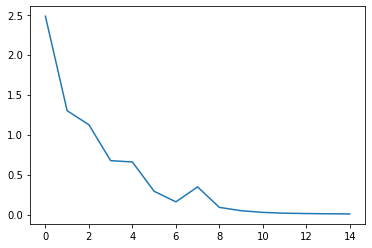

In [18]:
plt.plot(valid_los)

## AdamOptimizer

In [20]:
import string
picDict = dict((i, string.ascii_uppercase[i]) for i in range(25))
flag = True

/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


---------------------------------------------------------
Epoch: 1, validation loss: 1.31, validation accuracy: 58.5%
Epoch: 2, validation loss: 0.88, validation accuracy: 71.0%
Epoch: 3, validation loss: 0.58, validation accuracy: 80.3%
Epoch: 4, validation loss: 0.28, validation accuracy: 90.6%
Epoch: 5, validation loss: 0.33, validation accuracy: 87.3%
Epoch: 6, validation loss: 0.11, validation accuracy: 96.8%
Epoch: 7, validation loss: 0.04, validation accuracy: 99.0%
Epoch: 8, validation loss: 0.12, validation accuracy: 95.9%
Epoch: 9, validation loss: 0.05, validation accuracy: 98.4%
Epoch: 10, validation loss: 0.05, validation accuracy: 98.4%
Epoch: 11, validation loss: 0.06, validation accuracy: 98.3%
Epoch: 12, validation loss: 0.00, validation accuracy: 100.0%
Epoch: 13, validation loss: 0.00, validation accuracy: 100.0%
Epoch: 14, validation loss: 0.00, validation accuracy: 100.0%
Epoch: 15, validation loss: 0.00, validation accuracy: 100.0%
--------------------------------

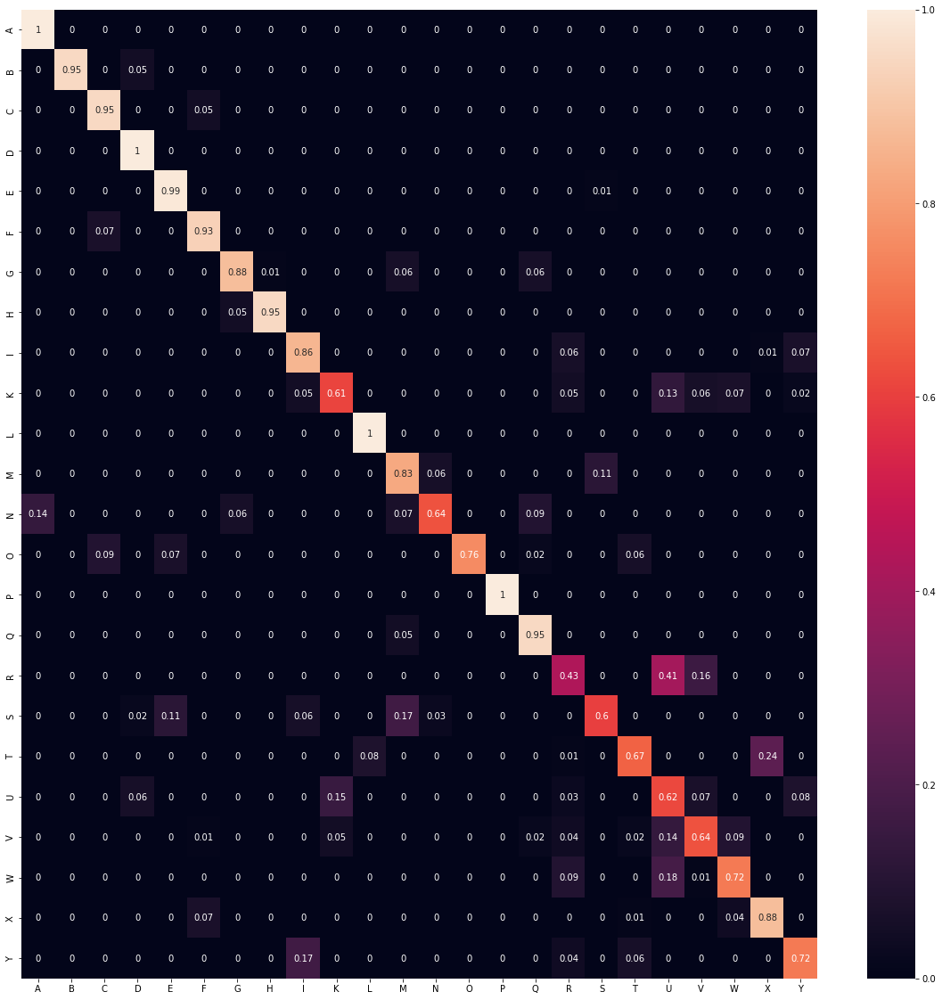

In [23]:
tf.reset_default_graph()

MLP_Adam = MLP(layers=[784, 512, 512, 64, 25], Optimizer=tf.train.AdamOptimizer,
           rl=0.001, normal_std=0.1, dropout_flag = False, batch_norm_flag = False, num_class = 25)

training_los, valid_los = MLP_Adam.train(x_train=x_train_shaffle, y_train=y_train_shaffle,
                                        x_valid=x_valid, y_valid=y_valid_hot, num_epoch=15, batchsize=64)

import seaborn as sn
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

if flag == True:
  del picDict[9]
  flag = False
MLP_Adam.test_network(dftest, y_test, y_test_hot)

In [24]:
%load_ext tensorboard
%tensorboard --logdir logs/visualize_graph_Adam/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [25]:
%reload_ext tensorboard

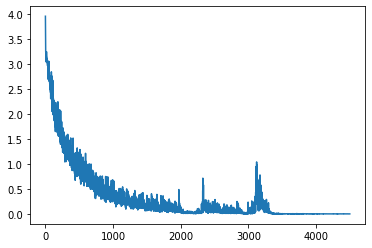

In [26]:
plt.plot(training_los)

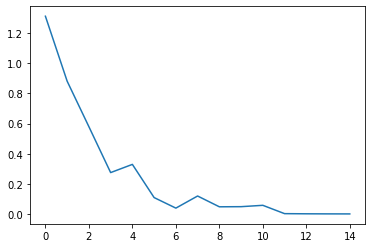

In [27]:
plt.plot(valid_los)

## Dropout

In [ ]:
import string
picDict = dict((i, string.ascii_uppercase[i]) for i in range(25))
flag = True

In [ ]:
tf.reset_default_graph()

MLP_SGD = MLP(layers=[784, 512, 512, 64, 25], Optimizer=tf.train.GradientDescentOptimizer,
           rl=0.05, normal_std=0.1, dropout_flag = True, batch_norm_flag = False, num_class = 25)

training_los, valid_los = MLP_SGD.train(x_train=x_train_shaffle, y_train=y_train_shaffle,
                                        x_valid=x_valid, y_valid=y_valid_hot, num_epoch=15, batchsize=64)

import seaborn as sn
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

if flag == True:
  del picDict[9]
  flag = False
MLP_SGD.test_network(dftest, y_test, y_test_hot)

In [ ]:
tf.reset_default_graph()

MLP_Adam = MLP(layers=[784, 512, 512, 64, 25], Optimizer=tf.train.AdamOptimizer,
           rl=0.001, normal_std=0.1, dropout_flag = False, batch_norm_flag = False, num_class = 25)

training_los, valid_los = MLP_Adam.train(x_train=x_train_shaffle, y_train=y_train_shaffle,
                                        x_valid=x_valid, y_valid=y_valid_hot, num_epoch=15, batchsize=64)

import seaborn as sn
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

if flag == True:
  del picDict[9]
  flag = False
MLP_Adam.test_network(dftest, y_test, y_test_hot)